In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import math

dataset = pd.read_csv(r"D:\PhD\CS5691\Assignments\Assignment1\datasets\function2_2d.csv",delimiter=',')
X_dataset = dataset[["x1","x2"]]
Y_dataset = dataset["y"]

range_min_x1 = math.floor(min(X_dataset["x1"]))
range_max_x1 = math.ceil(max(X_dataset["x1"]))
range_min_x2 = math.floor(min(X_dataset["x2"]))
range_max_x2 = math.ceil(max(X_dataset["x2"]))

x_train = X_dataset[:math.floor(0.7*len(X_dataset))]
y_train = Y_dataset[:math.floor(0.7*len(X_dataset))]
x_valid = X_dataset[math.floor(0.7*len(X_dataset)):math.floor(0.8*len(X_dataset))]
y_valid = Y_dataset[math.floor(0.7*len(X_dataset)):math.floor(0.8*len(X_dataset))]
x_test = X_dataset[math.floor(0.8*len(X_dataset)):len(X_dataset)]
y_test = Y_dataset[math.floor(0.8*len(X_dataset)):len(X_dataset)]

degree = 2
training_size = [50,200,500]
M = [2,3,6]

In [2]:
def phi_generate(M0,N,D,x_train,offset):
    phi_x1 = np.zeros((N,M0))
    phi_x2 = np.zeros((N,M0))
    for i in range(N):
        for j in range(M0):
            phi_x1[i][j] = x_train["x1"][i+offset]**j
            phi_x2[i][j] = x_train["x2"][i+offset]**j
    Phi = np.zeros((N,D))
    for i in range(N):
        A = np.outer(phi_x1[i],phi_x2[i])
        l=0
        for j in range(M0):
            for k in range(M0-j):
                Phi[i][l] = A[j][k]
                l+=1
    return Phi

In [3]:
def plot_3Dsurface(x_train,y_train,D,M0,w):
    points = 100
    x1 = np.linspace(range_min_x1,range_max_x1,points)
    x2 = np.linspace(range_min_x2,range_max_x2,points)
    x1,x2 = np.meshgrid(x1,x2)
    x1 = np.arange(range_min_x1,range_max_x1,0.1)
    x2 = x1
    x1,x2 = np.meshgrid(x1,x2)

    phi_x1 = np.zeros(D)
    phi_x2 = np.zeros(D)
    l = 0
    for j in range(M0):
        for k in range(M0-j):
            phi_x1[l] = j
            phi_x2[l] = k
            l+=1
    f_x1_x2 = 0
    for i in range(D):
        f_x1_x2 += (x1**phi_x1[i])*(x2**phi_x2[i])*w[i]

    fig = plt.figure(figsize = (10, 7)) 
    ax = fig.gca(projection ='3d') 
    ax.scatter3D(x_train["x1"], x_train["x2"], y_train, color = "red") 
    ax.plot_surface(x1, x2, f_x1_x2, cmap = "bone", alpha=0.75)
    ax.set_xlabel("X1-axis", fontweight = "bold")
    ax.set_ylabel("X2-axis", fontweight = "bold")
    ax.set_zlabel("Y-axis", fontweight = "bold")
    plt.show()

In [4]:
def erms_error(M0,N,x_train,y_train,lamda):
    D = int(math.factorial(M0 + degree)/((math.factorial(M0))*(math.factorial(degree))))
    I = np.identity(D)
    Phi = phi_generate(M0+1,N,D,x_train,0)

    w = np.linalg.inv(Phi.transpose().dot(Phi)+lamda*I).dot(Phi.transpose()).dot(y_train)

    plot_3Dsurface(x_train,y_train,D,M0+1,w)    
    
    predicted = Phi.dot(w)
    plt.scatter(y_train, predicted, color = "blue")
    plt.show() 
    
    error_train = 0
    for i in range(len(y_train)):
        error_train += (predicted[i]-y_train[i])**2
    
    error_train /= len(y_train)
    
    #for test data
    predicted = phi_generate(M0+1,len(x_test),D,x_test,math.floor(0.8*len(X_dataset))).dot(w)    
    plt.scatter(y_test, predicted,color = "red")
    plt.show()   
    
    error_test = 0
    for i in range(len(y_test)):
        error_test += (predicted[i]-y_test[i+math.floor(0.8*len(X_dataset))])**2
    
    error_test /= len(y_test)
    #for validation data
    predicted = phi_generate(M0+1,len(x_valid),D,x_valid,math.floor(0.7*len(X_dataset))).dot(w)
    
    error_valid = 0
    for i in range(len(y_valid)):
        error_valid += (predicted[i]-y_valid[i+math.floor(0.7*len(X_dataset))])**2
    
    error_valid /= len(y_valid)
    return math.sqrt(error_train),math.sqrt(error_valid),math.sqrt(error_test)

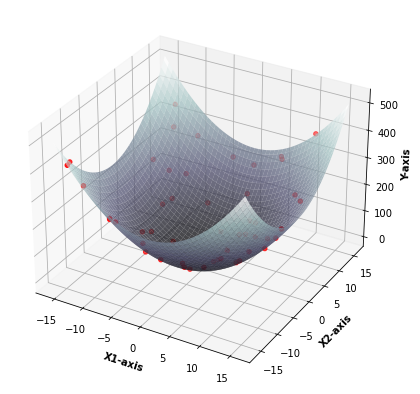

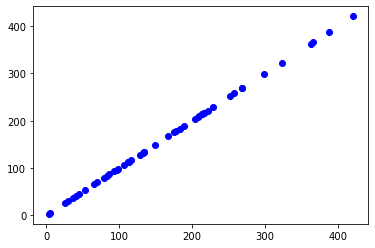

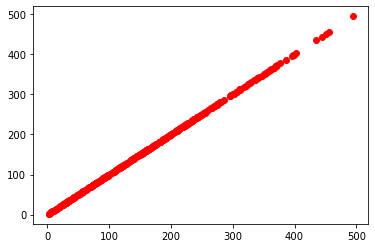

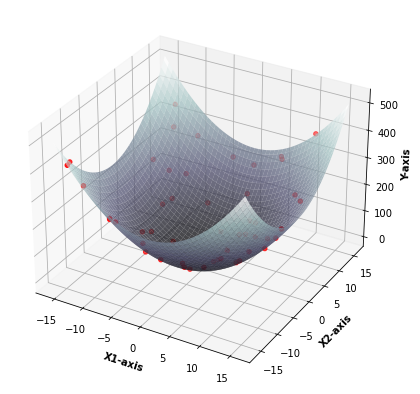

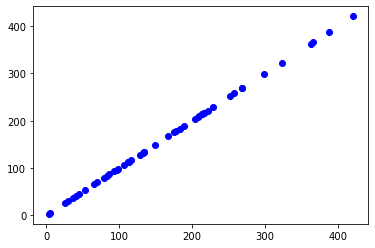

...

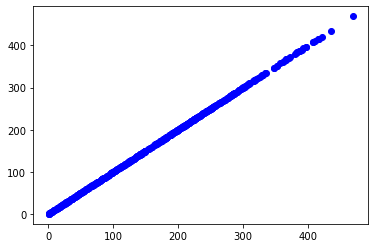

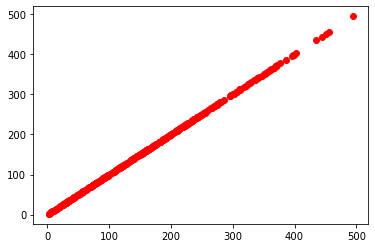

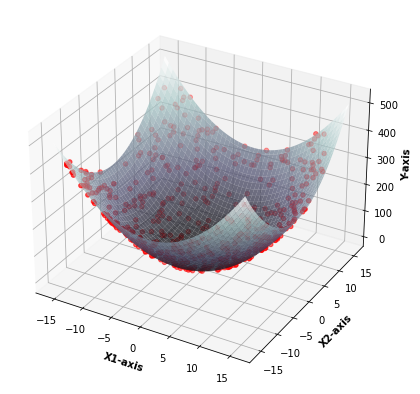

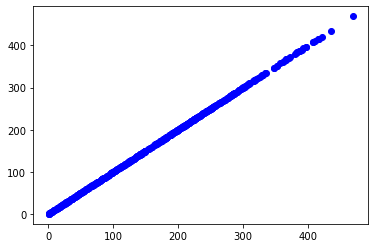

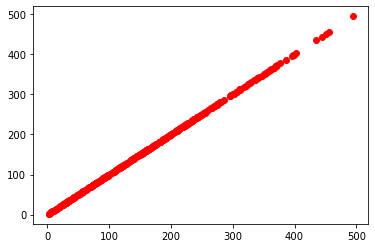

[[1.56047716e-13 4.63308276e-13 2.19174890e-10]
 [1.26092381e-13 6.96998808e-13 2.20376673e-10]
 [2.02755506e-13 7.94498579e-13 3.17547684e-10]]
[[1.55243705e-13 5.50563269e-13 7.39725593e-10]
 [1.15394823e-13 7.42801749e-13 2.19760865e-10]
 [2.05866366e-13 7.46803375e-13 2.88528252e-10]]
[[1.53929399e-13 5.40199940e-13 9.72789916e-10]
 [1.26629514e-13 7.28013244e-13 2.16770746e-10]
 [2.09637381e-13 7.70622227e-13 2.87977433e-10]]


In [5]:
lamda = 0 #math.e**(-18)
error_train = np.zeros((len(training_size),len(M)))
error_test = np.zeros((len(training_size),len(M)))
error_valid = np.zeros((len(training_size),len(M)))
for i in range(len(training_size)):
    x_train = X_dataset[:training_size[i]]
    y_train = Y_dataset[:training_size[i]]
    for j in range(len(M)):
        error_train[i][j], error_valid[i][j], error_test[i][j] = erms_error(M[j],training_size[i],x_train,y_train,lamda)
        
print(error_train)
print(error_valid)
print(error_test)

In [6]:
def gaussian_Basis(x_train,mean,sigma_square,k,offset):
    Phi = np.zeros((k,len(x_train)))
    for i in range(k):
        Phi[i] = math.e**(-((x_train["x1"]-mean[i][0])**2+(x_train["x2"]-mean[i][1])**2)/sigma_square)
    return Phi.transpose()

In [7]:
def generatePhi_tilde(mean,sigma_square,k,degree):    
    Phi_tilde = np.zeros((k,k))
    for i in range(k):
        for j in range(k):
            for l in range(degree):
                Phi_tilde[i][j] += (mean[i][l]-mean[j][l])**2
    return math.e**(Phi_tilde*(-1)/sigma_square)

In [8]:
def erms_error_gaussian(x_train,y_train,lamda,mean,sigma_square,k):
    Phi = gaussian_Basis(x_train,mean,sigma_square,k,0)
    I = generatePhi_tilde(mean,sigma_square,k,degree)
    w = np.linalg.inv(Phi.transpose().dot(Phi)+lamda*I).dot(Phi.transpose().dot(y_train))

    predicted = Phi.dot(w)
    plt.scatter(y_train, predicted, color = "blue")
    plt.show() 

    error_train = 0
    for i in range(len(y_train)):
        error_train += (predicted[i]-y_train[i])**2

    error_train /= len(y_train)
    
    predicted = gaussian_Basis(x_valid,mean,sigma_square,k,math.floor(0.7*len(X_dataset))).dot(w)

    error_valid = 0
    for i in range(len(y_valid)):
        error_valid += (predicted[i]-y_valid[i+math.floor(0.7*len(X_dataset))])**2
        
    error_valid /= len(y_valid)  
    
    predicted = gaussian_Basis(x_test,mean,sigma_square,k,math.floor(0.8*len(X_dataset))).dot(w)
    plt.scatter(y_test, predicted, color = "red")
    plt.show() 

    error_test = 0
    for i in range(len(y_test)):
        error_test += (predicted[i]-y_test[i+math.floor(0.8*len(X_dataset))])**2

    error_test /= len(y_test)
    return math.sqrt(error_train),math.sqrt(error_valid),math.sqrt(error_test)

In [9]:
def Euclidean_distance(data1,data2):
    return math.sqrt(sum((data1-data2)**2))

In [10]:
def assignCluster(mean,data,k):
    z = np.zeros((len(data),k))
    for i in range(len(data)):
        closest = Euclidean_distance([data["x1"][i],data["x2"][i]],mean[0])**2
        z[i][0] = 1
        for j in range(len(mean)):
            dist = Euclidean_distance([data["x1"][i],data["x2"][i]],mean[j])**2
            if(dist < closest):
                closest = dist
                z[i] = np.zeros(k)
                z[i][j] = 1
    return z

In [11]:
def updateMean(z,data,k):
    mean = np.zeros((k,degree))
    N = sum(z)
    for i in range(k):
        for j in range(len(data)):
            mean[i][0]+=data["x1"][j]*z[j][i]
            mean[i][1]+=data["x2"][j]*z[j][i]
        mean[i]/=N[i]
    return mean

In [12]:
def KmeansClustering(k,data,iteration):
    mean = np.zeros((k,degree))
    mean_index_initial = np.random.choice(len(data),k)
    for i in range(k):
        mean[i][0] = data["x1"][mean_index_initial[i]]
        mean[i][1] = data["x2"][mean_index_initial[i]]
    z_old = assignCluster(mean,data,k)
    for i in range(iteration):
        mean = updateMean(z_old,data,k)
        z_new = assignCluster(mean,data,k)
        if np.allclose(z_new,z_old):
            return mean
        z_old = z_new
    return mean

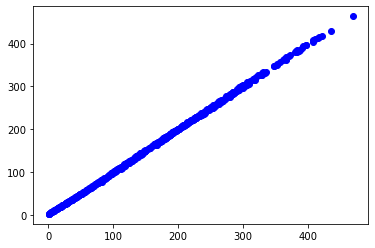

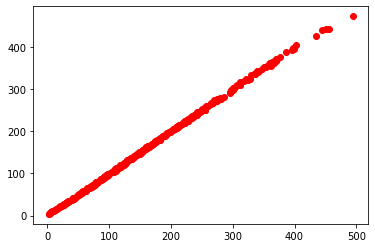

1.5475997537920598
1.6853976556434056
2.1553234313119045


In [13]:
sigma_square = 400
k = 24
lamda_th = 0#math.e**(-18)
mean = KmeansClustering(k,X_dataset,100)
error_train,error_valid,error_test = erms_error_gaussian(x_train,y_train,lamda_th,mean,sigma_square,k)
print(error_train)
print(error_valid)
print(error_test)